# FGADR Dataset - Comprehensive Analysis

Este notebook realiza uma análise completa do dataset FGADR para segmentação multi-classe de lesões retinianas.

**Objetivos:**
- Explorar a estrutura e tamanho do dataset (1842 imagens vs 54 do IDRiD)
- Analisar co-ocorrência de classes (hemorragia + exsudato)
- Estatísticas de distribuição por paciente (muito importante!)
- Visualização t-SNE dos embeddings por classe
- Avaliar viabilidade para segmentação multi-canal

**Dataset:** `/home/lucas/fgadr/Seg-set/`

## 1. Imports e Configuração

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image
import cv2
from collections import Counter, defaultdict
from itertools import combinations
import warnings
warnings.filterwarnings('ignore')

# Deep Learning
import torch
import torch.nn as nn
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader

# t-SNE
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Configurações de visualização
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
%matplotlib inline

# Configurações
FGADR_PATH = Path('/home/lucas/fgadr/Seg-set')
IDRID_SAMPLES = 54  # Para comparação

print("✓ Imports carregados com sucesso!")

✓ Imports carregados com sucesso!


## 2. Carregamento e Exploração Inicial

In [2]:
# Estrutura do dataset
print("="*80)
print("ESTRUTURA DO DATASET FGADR")
print("="*80)

classes = {
    'HardExudate': 'HardExudate_Masks',
    'SoftExudate': 'SoftExudate_Masks',
    'Hemorrhage': 'Hemohedge_Masks',
    'Microaneurysms': 'Microaneurysms_Masks',
    'IRMA': 'IRMA_Masks',
    'Neovascularization': 'Neovascularization_Masks'
}

# Contagem de arquivos
images_path = FGADR_PATH / 'Original_Images'
num_images = len(list(images_path.glob('*.png')))

print(f"\n📊 TOTAL DE IMAGENS: {num_images}")
print(f"📊 COMPARAÇÃO COM IDRiD: {num_images / IDRID_SAMPLES:.1f}x maior ({num_images} vs {IDRID_SAMPLES})")

print(f"\n📁 Classes disponíveis:")
for class_name, folder_name in classes.items():
    mask_path = FGADR_PATH / folder_name
    num_masks = len(list(mask_path.glob('*.png')))
    print(f"  • {class_name:20s}: {num_masks:4d} máscaras")

# Carregar CSV de labels
csv_path = FGADR_PATH / 'DR_Seg_Grading_Label.csv'
df_labels = pd.read_csv(csv_path)
print(f"\n📄 CSV carregado: {len(df_labels)} registros")
print(f"\n📋 Colunas do CSV:")
print(df_labels.columns.tolist())

ESTRUTURA DO DATASET FGADR

📊 TOTAL DE IMAGENS: 1842
📊 COMPARAÇÃO COM IDRiD: 34.1x maior (1842 vs 54)

📁 Classes disponíveis:
  • HardExudate         : 1842 máscaras
  • SoftExudate         : 1842 máscaras
  • Hemorrhage          : 1842 máscaras
  • Microaneurysms      : 1842 máscaras
  • IRMA                :  159 máscaras
  • Neovascularization  :   49 máscaras

📄 CSV carregado: 1841 registros

📋 Colunas do CSV:
['0000_1.png', '2']


In [3]:
# Analisar estrutura dos nomes dos arquivos para extrair patient IDs
sample_files = sorted(list(images_path.glob('*.png')))[:20]
print("\n📝 Exemplo de nomes de arquivos:")
for f in sample_files[:10]:
    print(f"  {f.name}")

# Extrair patient IDs (número antes do underscore)
def extract_patient_id(filename):
    """Extrai o ID do paciente do nome do arquivo (e.g., '0000_1.png' -> '0000')"""
    return filename.split('_')[0]

# Criar DataFrame com informações de todas as imagens
all_images = sorted(list(images_path.glob('*.png')))
df_images = pd.DataFrame({
    'filename': [f.name for f in all_images],
    'patient_id': [extract_patient_id(f.name) for f in all_images]
})

print(f"\n👥 ANÁLISE DE PACIENTES:")
print(f"  • Total de imagens: {len(df_images)}")
print(f"  • Total de pacientes únicos: {df_images['patient_id'].nunique()}")
print(f"  • Média de imagens por paciente: {len(df_images) / df_images['patient_id'].nunique():.2f}")

# Distribuição de imagens por paciente
images_per_patient = df_images.groupby('patient_id').size()
print(f"\n📊 Distribuição de imagens por paciente:")
print(f"  • Mínimo: {images_per_patient.min()}")
print(f"  • Máximo: {images_per_patient.max()}")
print(f"  • Mediana: {images_per_patient.median():.0f}")
print(f"  • Moda: {images_per_patient.mode().values[0]}")

df_images.head(10)


📝 Exemplo de nomes de arquivos:
  0000_1.png
  0001_2.png
  0002_1.png
  0003_3.png
  0004_1.png
  0005_1.png
  0006_1.png
  0007_2.png
  0008_2.png
  0009_1.png

👥 ANÁLISE DE PACIENTES:
  • Total de imagens: 1842
  • Total de pacientes únicos: 1842
  • Média de imagens por paciente: 1.00

📊 Distribuição de imagens por paciente:
  • Mínimo: 1
  • Máximo: 1
  • Mediana: 1
  • Moda: 1


,filename,patient_id
0,0000_1.png,0000
1,0001_2.png,0001
2,0002_1.png,0002
3,0003_3.png,0003
4,0004_1.png,0004
5,0005_1.png,0005
6,0006_1.png,0006
7,0007_2.png,0007
8,0008_2.png,0008
9,0009_1.png,0009


## 3. Análise de Presença de Classes e Co-ocorrência

In [4]:
# Para cada imagem, verificar quais classes estão presentes (baseado em máscaras não-vazias)
print("Analisando presença de classes em cada imagem...")

class_presence = []

for img_file in all_images:
    img_name = img_file.name
    presence = {'filename': img_name}
    
    for class_name, folder_name in classes.items():
        mask_path = FGADR_PATH / folder_name / img_name
        
        if mask_path.exists():
            mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
            # Classe presente se há pixels > 0 na máscara
            has_class = np.sum(mask > 0) > 0
            presence[class_name] = has_class
        else:
            presence[class_name] = False
    
    class_presence.append(presence)

df_presence = pd.DataFrame(class_presence)
df_presence = df_presence.merge(df_images[['filename', 'patient_id']], on='filename')

print("✓ Análise concluída!")
print(f"\n📊 Resumo de presença de classes:")
for class_name in classes.keys():
    count = df_presence[class_name].sum()
    pct = 100 * count / len(df_presence)
    print(f"  • {class_name:20s}: {count:4d} imagens ({pct:5.1f}%)")

Analisando presença de classes em cada imagem...
✓ Análise concluída!

📊 Resumo de presença de classes:
  • HardExudate         : 1279 imagens ( 69.4%)
  • SoftExudate         :  627 imagens ( 34.0%)
  • Hemorrhage          : 1456 imagens ( 79.0%)
  • Microaneurysms      : 1424 imagens ( 77.3%)
  • IRMA                :  159 imagens (  8.6%)
  • Neovascularization  :   49 imagens (  2.7%)


ANÁLISE DE CO-OCORRÊNCIA DE CLASSES


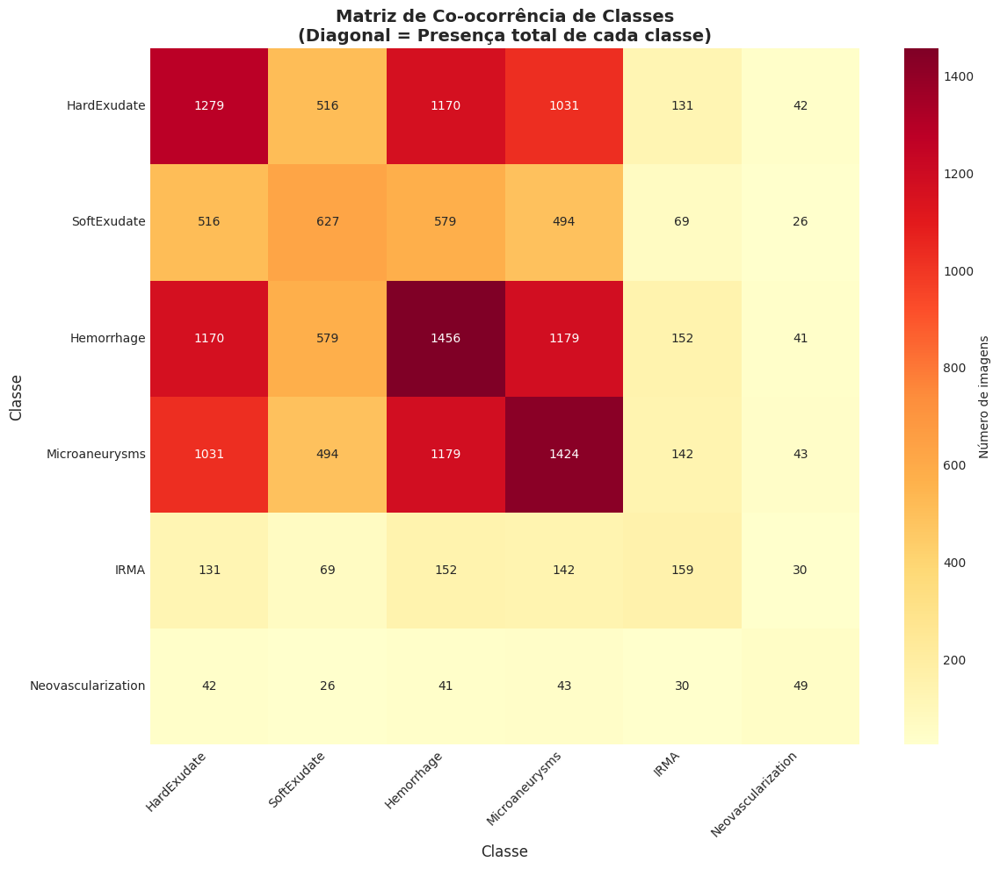


🔍 ANÁLISE ESPECÍFICA: Hemorragia + Exsudatos
--------------------------------------------------------------------------------

Hemorragia + Hard Exudate:
  • Ambas presentes: 1170 imagens (63.5%)
  • Apenas Hemorragia: 286 imagens
  • Apenas Hard Exudate: 109 imagens
  • Co-ocorrência em relação ao total de Hemorragia: 80.4%
  • Co-ocorrência em relação ao total de Hard Exudate: 91.5%

Hemorragia + Soft Exudate:
  • Ambas presentes: 579 imagens (31.4%)
  • Apenas Soft Exudate: 48 imagens
  • Co-ocorrência em relação ao total de Hemorragia: 39.8%
  • Co-ocorrência em relação ao total de Soft Exudate: 92.3%


In [5]:
# Análise de co-ocorrência - IMPORTANTE: Hemorragia + Exsudato
print("="*80)
print("ANÁLISE DE CO-OCORRÊNCIA DE CLASSES")
print("="*80)

# Matriz de co-ocorrência
class_names = list(classes.keys())
cooccurrence_matrix = np.zeros((len(class_names), len(class_names)))

for i, class1 in enumerate(class_names):
    for j, class2 in enumerate(class_names):
        both_present = (df_presence[class1] & df_presence[class2]).sum()
        cooccurrence_matrix[i, j] = both_present

# Visualizar matriz de co-ocorrência
plt.figure(figsize=(12, 10))
sns.heatmap(cooccurrence_matrix, annot=True, fmt='.0f', 
            xticklabels=class_names, yticklabels=class_names,
            cmap='YlOrRd', cbar_kws={'label': 'Número de imagens'})
plt.title('Matriz de Co-ocorrência de Classes\n(Diagonal = Presença total de cada classe)', 
          fontsize=14, fontweight='bold')
plt.xlabel('Classe', fontsize=12)
plt.ylabel('Classe', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Análise específica: Hemorragia + Exsudatos
print("\n🔍 ANÁLISE ESPECÍFICA: Hemorragia + Exsudatos")
print("-" * 80)

# Hard Exudate + Hemorrhage
both_he_hard = (df_presence['Hemorrhage'] & df_presence['HardExudate']).sum()
only_hem = (df_presence['Hemorrhage'] & ~df_presence['HardExudate']).sum()
only_hard = (~df_presence['Hemorrhage'] & df_presence['HardExudate']).sum()
total_hem = df_presence['Hemorrhage'].sum()
total_hard = df_presence['HardExudate'].sum()

print(f"\nHemorragia + Hard Exudate:")
print(f"  • Ambas presentes: {both_he_hard} imagens ({100*both_he_hard/len(df_presence):.1f}%)")
print(f"  • Apenas Hemorragia: {only_hem} imagens")
print(f"  • Apenas Hard Exudate: {only_hard} imagens")
print(f"  • Co-ocorrência em relação ao total de Hemorragia: {100*both_he_hard/total_hem:.1f}%")
print(f"  • Co-ocorrência em relação ao total de Hard Exudate: {100*both_he_hard/total_hard:.1f}%")

# Soft Exudate + Hemorrhage
both_he_soft = (df_presence['Hemorrhage'] & df_presence['SoftExudate']).sum()
only_soft = (~df_presence['Hemorrhage'] & df_presence['SoftExudate']).sum()
total_soft = df_presence['SoftExudate'].sum()

print(f"\nHemorragia + Soft Exudate:")
print(f"  • Ambas presentes: {both_he_soft} imagens ({100*both_he_soft/len(df_presence):.1f}%)")
print(f"  • Apenas Soft Exudate: {only_soft} imagens")
print(f"  • Co-ocorrência em relação ao total de Hemorragia: {100*both_he_soft/total_hem:.1f}%")
print(f"  • Co-ocorrência em relação ao total de Soft Exudate: {100*both_he_soft/total_soft:.1f}%")


📊 ESTATÍSTICAS MULTI-LABEL:
--------------------------------------------------------------------------------

Número de classes por imagem:
  • 0 classe(s):  103 imagens (  5.6%)
  • 1 classe(s):  203 imagens ( 11.0%)
  • 2 classe(s):  391 imagens ( 21.2%)
  • 3 classe(s):  653 imagens ( 35.5%)
  • 4 classe(s):  425 imagens ( 23.1%)
  • 5 classe(s):   52 imagens (  2.8%)
  • 6 classe(s):   15 imagens (  0.8%)


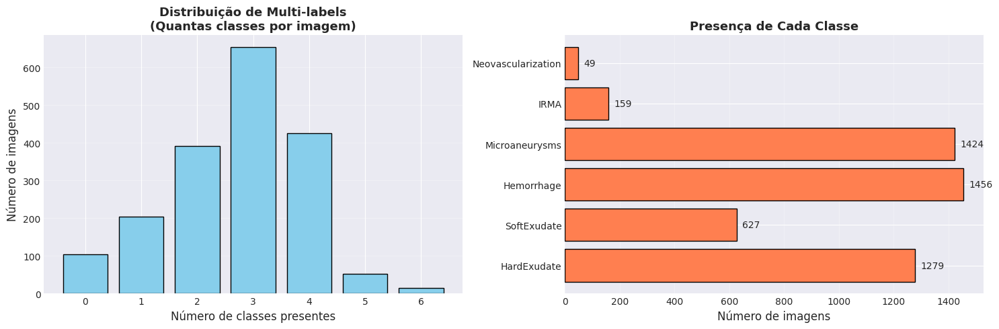

In [6]:
# Número de classes por imagem
df_presence['num_classes'] = df_presence[list(classes.keys())].sum(axis=1)

print("\n📊 ESTATÍSTICAS MULTI-LABEL:")
print("-" * 80)
print(f"\nNúmero de classes por imagem:")
for n in range(7):
    count = (df_presence['num_classes'] == n).sum()
    pct = 100 * count / len(df_presence)
    print(f"  • {n} classe(s): {count:4d} imagens ({pct:5.1f}%)")

# Visualização
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Gráfico 1: Distribuição de número de classes
ax1 = axes[0]
num_classes_counts = df_presence['num_classes'].value_counts().sort_index()
ax1.bar(num_classes_counts.index, num_classes_counts.values, color='skyblue', edgecolor='black')
ax1.set_xlabel('Número de classes presentes', fontsize=12)
ax1.set_ylabel('Número de imagens', fontsize=12)
ax1.set_title('Distribuição de Multi-labels\n(Quantas classes por imagem)', fontsize=13, fontweight='bold')
ax1.grid(axis='y', alpha=0.3)

# Gráfico 2: Presença de cada classe
ax2 = axes[1]
class_counts = [df_presence[c].sum() for c in class_names]
bars = ax2.barh(class_names, class_counts, color='coral', edgecolor='black')
ax2.set_xlabel('Número de imagens', fontsize=12)
ax2.set_title('Presença de Cada Classe', fontsize=13, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)

# Adicionar valores nas barras
for i, (bar, count) in enumerate(zip(bars, class_counts)):
    ax2.text(count + 20, i, f'{count}', va='center', fontsize=10)

plt.tight_layout()
plt.show()

## 4. Análise Detalhada por Paciente

ANÁLISE POR PACIENTE (MUITO IMPORTANTE!)

👥 Total de pacientes: 1842
📊 Total de imagens: 1842
📈 Imagens por paciente:
  • Média: 1.00
  • Mediana: 1
  • Min-Max: 1 - 1


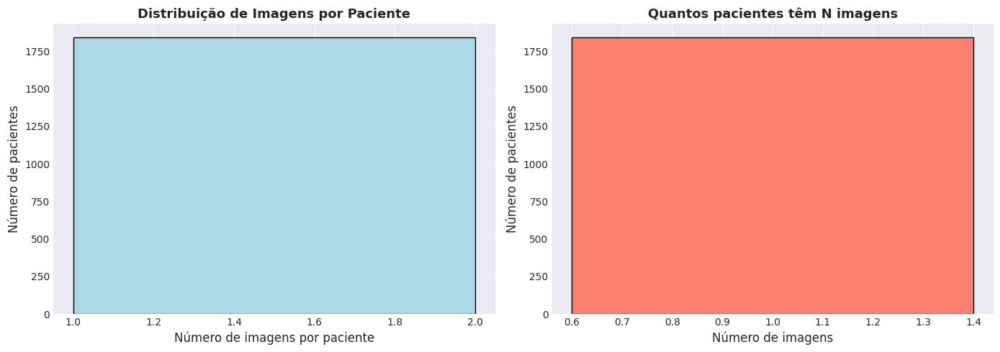


🔬 Presença de classes a nível de paciente:
  • HardExudate         : 1279 pacientes ( 69.4%)
  • SoftExudate         :  627 pacientes ( 34.0%)
  • Hemorrhage          : 1456 pacientes ( 79.0%)
  • Microaneurysms      : 1424 pacientes ( 77.3%)
  • IRMA                :  159 pacientes (  8.6%)
  • Neovascularization  :   49 pacientes (  2.7%)


In [7]:
print("="*80)
print("ANÁLISE POR PACIENTE (MUITO IMPORTANTE!)")
print("="*80)

# Estatísticas por paciente
patient_stats = []

for patient_id in df_presence['patient_id'].unique():
    patient_data = df_presence[df_presence['patient_id'] == patient_id]
    
    stats = {
        'patient_id': patient_id,
        'num_images': len(patient_data),
    }
    
    # Presença de cada classe neste paciente (pelo menos uma imagem)
    for class_name in class_names:
        stats[f'has_{class_name}'] = patient_data[class_name].any()
        stats[f'count_{class_name}'] = patient_data[class_name].sum()
    
    patient_stats.append(stats)

df_patients = pd.DataFrame(patient_stats)

print(f"\n👥 Total de pacientes: {len(df_patients)}")
print(f"📊 Total de imagens: {df_patients['num_images'].sum()}")
print(f"📈 Imagens por paciente:")
print(f"  • Média: {df_patients['num_images'].mean():.2f}")
print(f"  • Mediana: {df_patients['num_images'].median():.0f}")
print(f"  • Min-Max: {df_patients['num_images'].min()} - {df_patients['num_images'].max()}")

# Distribuição de imagens por paciente
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
df_patients['num_images'].hist(bins=range(1, df_patients['num_images'].max()+2), 
                                 edgecolor='black', color='lightblue')
plt.xlabel('Número de imagens por paciente', fontsize=12)
plt.ylabel('Número de pacientes', fontsize=12)
plt.title('Distribuição de Imagens por Paciente', fontsize=13, fontweight='bold')
plt.grid(axis='y', alpha=0.3)

plt.subplot(1, 2, 2)
value_counts = df_patients['num_images'].value_counts().sort_index()
plt.bar(value_counts.index, value_counts.values, edgecolor='black', color='salmon')
plt.xlabel('Número de imagens', fontsize=12)
plt.ylabel('Número de pacientes', fontsize=12)
plt.title('Quantos pacientes têm N imagens', fontsize=13, fontweight='bold')
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Análise de classes por paciente
print(f"\n🔬 Presença de classes a nível de paciente:")
for class_name in class_names:
    count = df_patients[f'has_{class_name}'].sum()
    pct = 100 * count / len(df_patients)
    print(f"  • {class_name:20s}: {count:4d} pacientes ({pct:5.1f}%)")

## 5. Visualização de Amostras com Co-ocorrência

📸 Visualizando 3 exemplos com Hemorragia + Hard Exudate co-ocorrentes



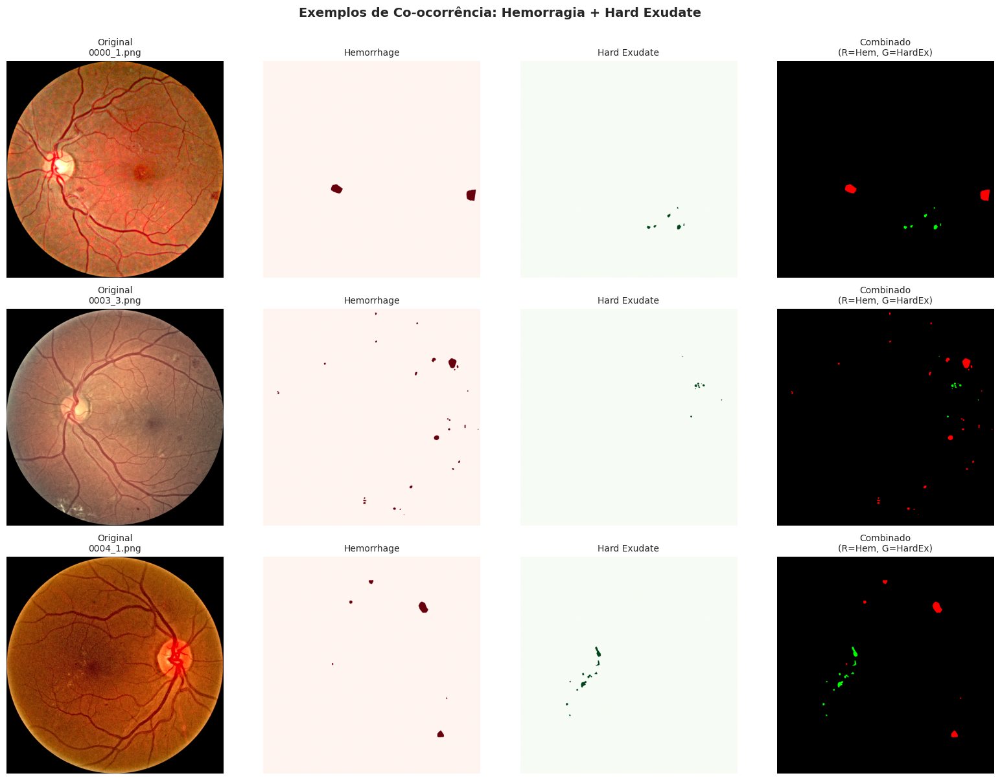

In [8]:
# Encontrar exemplos com hemorragia + exsudato
hem_hard_samples = df_presence[
    (df_presence['Hemorrhage'] == True) & 
    (df_presence['HardExudate'] == True)
]['filename'].head(3).values

print(f"📸 Visualizando {len(hem_hard_samples)} exemplos com Hemorragia + Hard Exudate co-ocorrentes\n")

fig, axes = plt.subplots(len(hem_hard_samples), 4, figsize=(16, 4*len(hem_hard_samples)))
if len(hem_hard_samples) == 1:
    axes = axes.reshape(1, -1)

for idx, filename in enumerate(hem_hard_samples):
    # Imagem original
    img_path = FGADR_PATH / 'Original_Images' / filename
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Máscaras
    hem_mask = cv2.imread(str(FGADR_PATH / 'Hemohedge_Masks' / filename), cv2.IMREAD_GRAYSCALE)
    hard_mask = cv2.imread(str(FGADR_PATH / 'HardExudate_Masks' / filename), cv2.IMREAD_GRAYSCALE)
    
    # Máscara combinada (RGB)
    combined_mask = np.zeros((*hem_mask.shape, 3), dtype=np.uint8)
    combined_mask[:, :, 0] = hem_mask  # Vermelho para hemorragia
    combined_mask[:, :, 1] = hard_mask  # Verde para hard exudate
    
    # Plot
    axes[idx, 0].imshow(img)
    axes[idx, 0].set_title(f'Original\n{filename}', fontsize=10)
    axes[idx, 0].axis('off')
    
    axes[idx, 1].imshow(hem_mask, cmap='Reds')
    axes[idx, 1].set_title('Hemorrhage', fontsize=10)
    axes[idx, 1].axis('off')
    
    axes[idx, 2].imshow(hard_mask, cmap='Greens')
    axes[idx, 2].set_title('Hard Exudate', fontsize=10)
    axes[idx, 2].axis('off')
    
    axes[idx, 3].imshow(combined_mask)
    axes[idx, 3].set_title('Combinado\n(R=Hem, G=HardEx)', fontsize=10)
    axes[idx, 3].axis('off')

plt.suptitle('Exemplos de Co-ocorrência: Hemorragia + Hard Exudate', 
             fontsize=14, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

Visualizando segmentação multi-canal (todas as 6 classes)



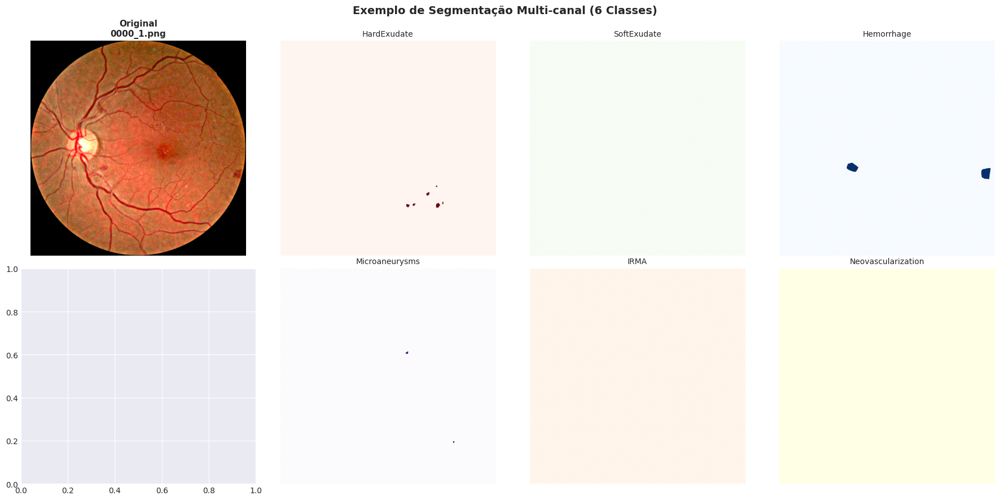


Classes presentes nesta imagem:
  ✓ HardExudate
  ✓ Hemorrhage
  ✓ Microaneurysms


In [9]:
# Visualizar máscara multi-canal (todas as classes)
print("Visualizando segmentação multi-canal (todas as 6 classes)\n")

# Pegar uma amostra com várias classes
multi_class_sample = df_presence[df_presence['num_classes'] >= 3].iloc[0]['filename']

fig, axes = plt.subplots(2, 4, figsize=(18, 9))

# Imagem original
img_path = FGADR_PATH / 'Original_Images' / multi_class_sample
img = cv2.imread(str(img_path))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
axes[0, 0].imshow(img)
axes[0, 0].set_title(f'Original\n{multi_class_sample}', fontsize=11, fontweight='bold')
axes[0, 0].axis('off')

# Cada classe individual
colors = ['Reds', 'Greens', 'Blues', 'Purples', 'Oranges', 'YlOrBr']
for idx, (class_name, folder_name) in enumerate(classes.items()):
    row = idx // 3
    col = (idx % 3) + 1
    
    mask_path = FGADR_PATH / folder_name / multi_class_sample
    if mask_path.exists():
        mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
    else:
        mask = np.zeros_like(img[:, :, 0])
    
    axes[row, col].imshow(mask, cmap=colors[idx])
    axes[row, col].set_title(class_name, fontsize=10)
    axes[row, col].axis('off')

plt.suptitle('Exemplo de Segmentação Multi-canal (6 Classes)', 
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Estatísticas desta imagem
img_info = df_presence[df_presence['filename'] == multi_class_sample].iloc[0]
print(f"\nClasses presentes nesta imagem:")
for class_name in class_names:
    if img_info[class_name]:
        print(f"  ✓ {class_name}")

## 6. Extração de Features para t-SNE

In [10]:
# Usar ResNet18 pré-treinado para extrair features
print("🔧 Configurando extrator de features (ResNet18 pré-treinado)...")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

# Carregar modelo pré-treinado
resnet = models.resnet18(pretrained=True)
# Remover última camada (classificação)
feature_extractor = nn.Sequential(*list(resnet.children())[:-1])
feature_extractor = feature_extractor.to(device)
feature_extractor.eval()

# Transformações
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

print("✓ Extrator configurado!")
print(f"\n Extraindo features de {len(all_images)} imagens...")
print("   (Isso pode levar alguns minutos...)")

🔧 Configurando extrator de features (ResNet18 pré-treinado)...
Device: cuda
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /home/lucas/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 52.9MB/s]


✓ Extrator configurado!

 Extraindo features de 1842 imagens...
   (Isso pode levar alguns minutos...)


In [11]:
# Extrair features
features_list = []
filenames_list = []

batch_size = 32
num_batches = (len(all_images) + batch_size - 1) // batch_size

with torch.no_grad():
    for batch_idx in range(num_batches):
        start_idx = batch_idx * batch_size
        end_idx = min((batch_idx + 1) * batch_size, len(all_images))
        batch_files = all_images[start_idx:end_idx]
        
        batch_images = []
        batch_filenames = []
        
        for img_file in batch_files:
            try:
                img = Image.open(img_file).convert('RGB')
                img_tensor = transform(img)
                batch_images.append(img_tensor)
                batch_filenames.append(img_file.name)
            except Exception as e:
                print(f"Erro ao processar {img_file.name}: {e}")
                continue
        
        if len(batch_images) > 0:
            batch_tensor = torch.stack(batch_images).to(device)
            features = feature_extractor(batch_tensor)
            features = features.squeeze(-1).squeeze(-1)  # Remove dimensões espaciais
            
            features_list.append(features.cpu().numpy())
            filenames_list.extend(batch_filenames)
        
        if (batch_idx + 1) % 10 == 0:
            print(f"  Processado: {end_idx}/{len(all_images)} imagens")

# Concatenar features
features_array = np.vstack(features_list)
print(f"\n✓ Features extraídas: {features_array.shape}")
print(f"  • {features_array.shape[0]} imagens")
print(f"  • {features_array.shape[1]} dimensões por imagem")

  Processado: 320/1842 imagens
  Processado: 640/1842 imagens
  Processado: 960/1842 imagens
  Processado: 1280/1842 imagens
  Processado: 1600/1842 imagens

✓ Features extraídas: (1842, 512)
  • 1842 imagens
  • 512 dimensões por imagem


In [12]:
# Preparar labels para visualização
# Para cada imagem, criar label baseado nas classes presentes

df_features = pd.DataFrame({'filename': filenames_list})
df_features = df_features.merge(df_presence, on='filename')

# Criar diferentes tipos de labels

# Label 1: Classe dominante (a mais rara presente, ou "Multiple" se >2)
def get_dominant_label(row):
    present_classes = [c for c in class_names if row[c]]
    if len(present_classes) == 0:
        return 'No Lesion'
    elif len(present_classes) == 1:
        return present_classes[0]
    elif len(present_classes) == 2:
        return f"{present_classes[0][:4]}+{present_classes[1][:4]}"
    else:
        return 'Multiple (3+)'

df_features['dominant_label'] = df_features.apply(get_dominant_label, axis=1)

# Label 2: Específico para Hemorrhage e Exudates
def get_hem_ex_label(row):
    has_hem = row['Hemorrhage']
    has_hard = row['HardExudate']
    has_soft = row['SoftExudate']
    
    if has_hem and (has_hard or has_soft):
        return 'Hem+Exudate'
    elif has_hem:
        return 'Hemorrhage Only'
    elif has_hard or has_soft:
        return 'Exudate Only'
    else:
        return 'Other/None'

df_features['hem_ex_label'] = df_features.apply(get_hem_ex_label, axis=1)

# Label 3: Número de classes
df_features['num_classes_label'] = df_features['num_classes'].apply(
    lambda x: f'{x} classes' if x <= 2 else '3+ classes'
)

print("✓ Labels preparados!")
print(f"\nDistribuição de labels dominantes:")
print(df_features['dominant_label'].value_counts().head(10))

✓ Labels preparados!

Distribuição de labels dominantes:
dominant_label
Multiple (3+)     1145
Hemo+Micr          157
Microaneurysms     146
Hard+Hemo          123
No Lesion          103
Hard+Micr           62
Hemorrhage          26
Soft+Hemo           24
HardExudate         19
Soft+Micr           14
Name: count, dtype: int64


## 7. Visualização t-SNE dos Embeddings

In [14]:
# Primeiro reduzir dimensionalidade com PCA para acelerar t-SNE
print("Aplicando PCA para redução inicial de dimensionalidade...")
pca = PCA(n_components=50)
features_pca = pca.fit_transform(features_array)
print(f"  • Variância explicada: {pca.explained_variance_ratio_.sum():.2%}")

# Aplicar t-SNE
print("\nAplicando t-SNE (isso pode levar alguns minutos)...")
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000, verbose=1)
features_tsne = tsne.fit_transform(features_pca)

print("✓ t-SNE concluído!")

# Adicionar coordenadas t-SNE ao DataFrame
df_features['tsne_x'] = features_tsne[:, 0]
df_features['tsne_y'] = features_tsne[:, 1]

Aplicando PCA para redução inicial de dimensionalidade...
  • Variância explicada: 85.81%

Aplicando t-SNE (isso pode levar alguns minutos)...
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1842 samples in 0.001s...
[t-SNE] Computed neighbors for 1842 samples in 0.128s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1842
[t-SNE] Computed conditional probabilities for sample 1842 / 1842
[t-SNE] Mean sigma: 2.866662
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.766403
[t-SNE] KL divergence after 1000 iterations: 1.516966
✓ t-SNE concluído!


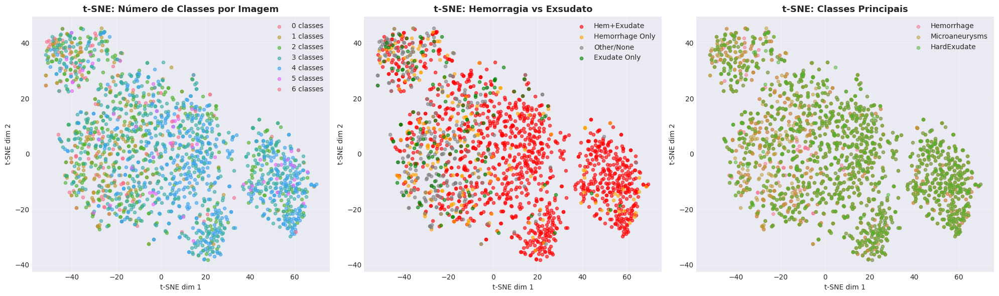

In [15]:
# Visualização 1: Por número de classes
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Plot 1: Número de classes
for num_cls in sorted(df_features['num_classes'].unique()):
    mask = df_features['num_classes'] == num_cls
    axes[0].scatter(
        df_features.loc[mask, 'tsne_x'],
        df_features.loc[mask, 'tsne_y'],
        label=f'{num_cls} classes',
        alpha=0.6,
        s=20
    )
axes[0].set_title('t-SNE: Número de Classes por Imagem', fontsize=13, fontweight='bold')
axes[0].set_xlabel('t-SNE dim 1')
axes[0].set_ylabel('t-SNE dim 2')
axes[0].legend()
axes[0].grid(alpha=0.3)

# Plot 2: Hemorrhage vs Exudate
unique_labels = df_features['hem_ex_label'].unique()
colors_hem_ex = {'Hem+Exudate': 'red', 'Hemorrhage Only': 'orange', 
                  'Exudate Only': 'green', 'Other/None': 'gray'}
for label in unique_labels:
    mask = df_features['hem_ex_label'] == label
    axes[1].scatter(
        df_features.loc[mask, 'tsne_x'],
        df_features.loc[mask, 'tsne_y'],
        label=label,
        alpha=0.6,
        s=20,
        c=colors_hem_ex.get(label, 'blue')
    )
axes[1].set_title('t-SNE: Hemorragia vs Exsudato', fontsize=13, fontweight='bold')
axes[1].set_xlabel('t-SNE dim 1')
axes[1].set_ylabel('t-SNE dim 2')
axes[1].legend()
axes[1].grid(alpha=0.3)

# Plot 3: Por classe individual (mais prevalentes)
top_classes = ['Hemorrhage', 'Microaneurysms', 'HardExudate']
for class_name in top_classes:
    mask = df_features[class_name] == True
    axes[2].scatter(
        df_features.loc[mask, 'tsne_x'],
        df_features.loc[mask, 'tsne_y'],
        label=class_name,
        alpha=0.5,
        s=20
    )
axes[2].set_title('t-SNE: Classes Principais', fontsize=13, fontweight='bold')
axes[2].set_xlabel('t-SNE dim 1')
axes[2].set_ylabel('t-SNE dim 2')
axes[2].legend()
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

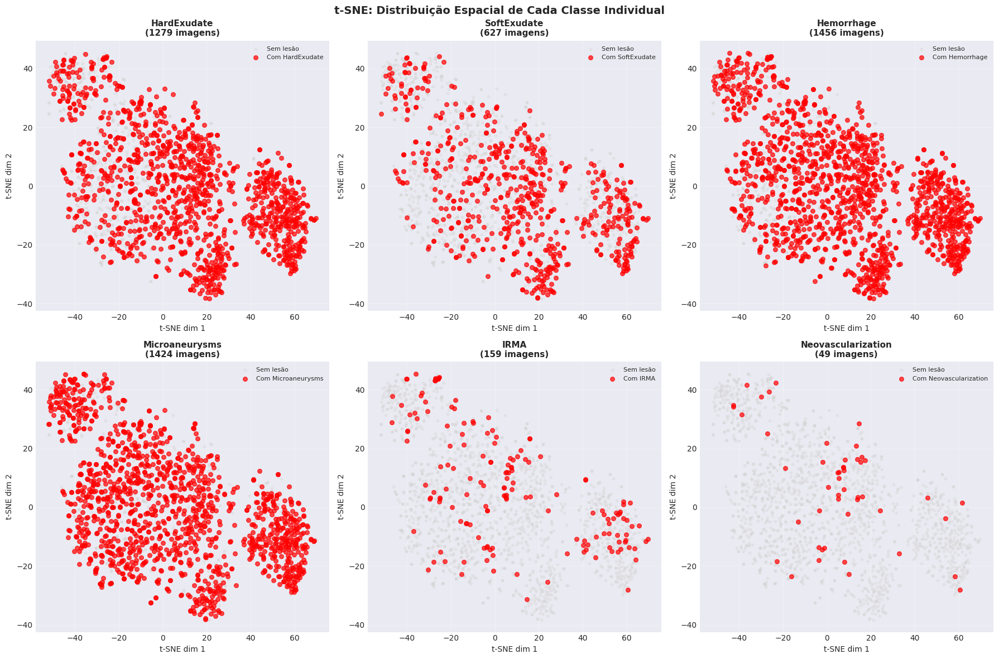

In [16]:
# Visualização individual de cada classe
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, class_name in enumerate(class_names):
    ax = axes[idx]
    
    # Pontos sem a classe (cinza claro)
    mask_without = df_features[class_name] == False
    ax.scatter(
        df_features.loc[mask_without, 'tsne_x'],
        df_features.loc[mask_without, 'tsne_y'],
        c='lightgray',
        alpha=0.3,
        s=10,
        label='Sem lesão'
    )
    
    # Pontos com a classe (colorido)
    mask_with = df_features[class_name] == True
    ax.scatter(
        df_features.loc[mask_with, 'tsne_x'],
        df_features.loc[mask_with, 'tsne_y'],
        c='red',
        alpha=0.7,
        s=30,
        label=f'Com {class_name}'
    )
    
    count = mask_with.sum()
    ax.set_title(f'{class_name}\n({count} imagens)', fontsize=11, fontweight='bold')
    ax.set_xlabel('t-SNE dim 1')
    ax.set_ylabel('t-SNE dim 2')
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

plt.suptitle('t-SNE: Distribuição Espacial de Cada Classe Individual', 
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 8. Análise de Clustering e Qualidade do Dataset

In [17]:
# Análise de distâncias entre embeddings
from scipy.spatial.distance import pdist, squareform

print("="*80)
print("ANÁLISE DE CLUSTERING E SEPARABILIDADE")
print("="*80)

# Calcular distâncias médias intra-classe e inter-classe
def calculate_class_distances(features, labels):
    """Calcula distâncias médias intra e inter-classe"""
    unique_labels = labels.unique()
    
    intra_distances = {}
    inter_distances = {}
    
    for label in unique_labels:
        mask = labels == label
        features_class = features[mask]
        
        if len(features_class) > 1:
            # Distância intra-classe
            dist_matrix = pdist(features_class, metric='euclidean')
            intra_distances[label] = dist_matrix.mean()
            
            # Distância inter-classe (para outras classes)
            features_other = features[~mask]
            if len(features_other) > 0:
                # Calcular distância entre centróides
                centroid_class = features_class.mean(axis=0)
                centroid_other = features_other.mean(axis=0)
                inter_distances[label] = np.linalg.norm(centroid_class - centroid_other)
    
    return intra_distances, inter_distances

# Análise por classe individual
print("\nAnálise de separabilidade por classe:")
print("-" * 80)

for class_name in class_names:
    labels = df_features[class_name].apply(lambda x: 'Presente' if x else 'Ausente')
    intra, inter = calculate_class_distances(features_tsne, labels)
    
    if 'Presente' in intra:
        ratio = inter.get('Presente', 0) / intra.get('Presente', 1)
        print(f"\n{class_name}:")
        print(f"  • Distância intra-classe: {intra.get('Presente', 0):.2f}")
        print(f"  • Distância inter-classe: {inter.get('Presente', 0):.2f}")
        print(f"  • Razão inter/intra: {ratio:.2f} {'✓ Boa separação' if ratio > 1.5 else '⚠ Separação moderada'}")

ANÁLISE DE CLUSTERING E SEPARABILIDADE

Análise de separabilidade por classe:
--------------------------------------------------------------------------------

HardExudate:
  • Distância intra-classe: 44.85
  • Distância inter-classe: 29.15
  • Razão inter/intra: 0.65 ⚠ Separação moderada

SoftExudate:
  • Distância intra-classe: 43.95
  • Distância inter-classe: 15.02
  • Razão inter/intra: 0.34 ⚠ Separação moderada

Hemorrhage:
  • Distância intra-classe: 45.31
  • Distância inter-classe: 33.20
  • Razão inter/intra: 0.73 ⚠ Separação moderada

Microaneurysms:
  • Distância intra-classe: 46.32
  • Distância inter-classe: 7.96
  • Razão inter/intra: 0.17 ⚠ Separação moderada

IRMA:
  • Distância intra-classe: 46.74
  • Distância inter-classe: 8.29
  • Razão inter/intra: 0.18 ⚠ Separação moderada

Neovascularization:
  • Distância intra-classe: 37.51
  • Distância inter-classe: 6.64
  • Razão inter/intra: 0.18 ⚠ Separação moderada



🔍 Detecção de possíveis outliers/anomalias:
--------------------------------------------------------------------------------

• Total de possíveis outliers: 0 (0.00%)


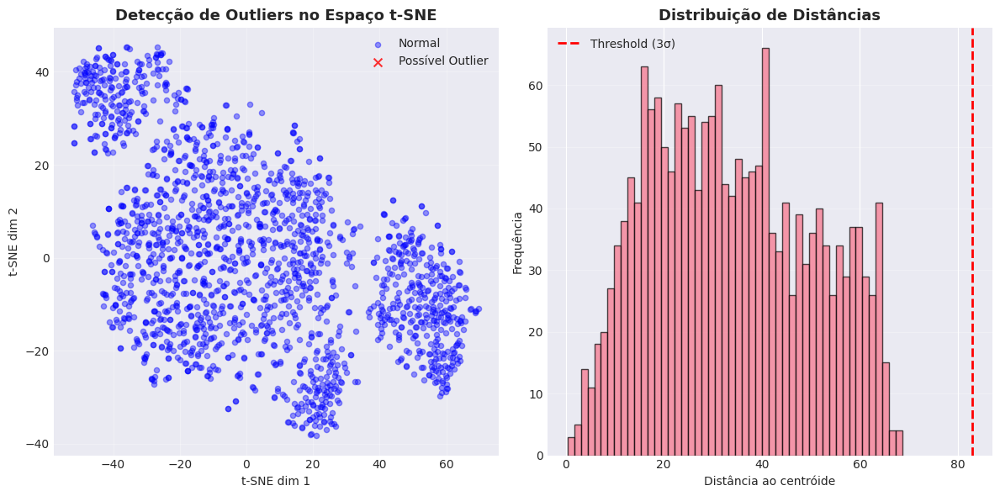

In [18]:
# Detecção de outliers usando distância ao centróide
print("\n🔍 Detecção de possíveis outliers/anomalias:")
print("-" * 80)

# Calcular distância de cada ponto ao centróide global
centroid = features_tsne.mean(axis=0)
distances_to_center = np.linalg.norm(features_tsne - centroid, axis=1)

# Identificar outliers (3 desvios padrão)
threshold = distances_to_center.mean() + 3 * distances_to_center.std()
outliers_mask = distances_to_center > threshold

df_features['distance_to_center'] = distances_to_center
df_features['is_outlier'] = outliers_mask

num_outliers = outliers_mask.sum()
print(f"\n• Total de possíveis outliers: {num_outliers} ({100*num_outliers/len(df_features):.2f}%)")

if num_outliers > 0:
    print(f"\nExemplos de outliers:")
    outlier_samples = df_features[df_features['is_outlier']].head(5)
    for idx, row in outlier_samples.iterrows():
        present_classes = [c for c in class_names if row[c]]
        print(f"  • {row['filename']}: {len(present_classes)} classes - {', '.join(present_classes)}")

# Visualizar outliers
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(df_features.loc[~outliers_mask, 'tsne_x'],
           df_features.loc[~outliers_mask, 'tsne_y'],
           c='blue', alpha=0.4, s=20, label='Normal')
plt.scatter(df_features.loc[outliers_mask, 'tsne_x'],
           df_features.loc[outliers_mask, 'tsne_y'],
           c='red', alpha=0.8, s=50, label='Possível Outlier', marker='x')
plt.xlabel('t-SNE dim 1')
plt.ylabel('t-SNE dim 2')
plt.title('Detecção de Outliers no Espaço t-SNE', fontsize=13, fontweight='bold')
plt.legend()
plt.grid(alpha=0.3)

plt.subplot(1, 2, 2)
plt.hist(distances_to_center, bins=50, edgecolor='black', alpha=0.7)
plt.axvline(threshold, color='red', linestyle='--', linewidth=2, label=f'Threshold (3σ)')
plt.xlabel('Distância ao centróide')
plt.ylabel('Frequência')
plt.title('Distribuição de Distâncias', fontsize=13, fontweight='bold')
plt.legend()
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

## 9. Análise Multi-canal para Segmentação

In [19]:
print("="*80)
print("ANÁLISE PARA SEGMENTAÇÃO MULTI-CANAL")
print("="*80)

# Estatísticas de overlap de pixels entre classes
print("\nAnálise de overlap espacial entre classes:")
print("-" * 80)

# Selecionar uma amostra de imagens para análise de overlap
sample_size = 100
sample_images = df_presence.sample(min(sample_size, len(df_presence)), random_state=42)

overlap_stats = []

for idx, row in sample_images.iterrows():
    filename = row['filename']
    
    # Carregar todas as máscaras
    masks = {}
    for class_name, folder_name in classes.items():
        mask_path = FGADR_PATH / folder_name / filename
        if mask_path.exists():
            mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
            masks[class_name] = (mask > 0).astype(int)
        else:
            masks[class_name] = np.zeros((1, 1), dtype=int)
    
    # Calcular overlap entre pares de classes
    for c1, c2 in combinations(class_names, 2):
        if masks[c1].size > 1 and masks[c2].size > 1:
            overlap = np.logical_and(masks[c1], masks[c2]).sum()
            total_c1 = masks[c1].sum()
            total_c2 = masks[c2].sum()
            
            if total_c1 > 0 or total_c2 > 0:
                overlap_stats.append({
                    'class1': c1,
                    'class2': c2,
                    'overlap_pixels': overlap,
                    'total_c1': total_c1,
                    'total_c2': total_c2
                })

df_overlap = pd.DataFrame(overlap_stats)

# Calcular estatísticas de overlap por par de classes
print(f"\nOverlap médio entre pares de classes (em {sample_size} imagens):")
if len(df_overlap) > 0:
    overlap_summary = df_overlap.groupby(['class1', 'class2']).agg({
        'overlap_pixels': 'mean',
        'total_c1': 'mean',
        'total_c2': 'mean'
    }).reset_index()
    
    overlap_summary['overlap_pct_c1'] = 100 * overlap_summary['overlap_pixels'] / (overlap_summary['total_c1'] + 1e-6)
    overlap_summary['overlap_pct_c2'] = 100 * overlap_summary['overlap_pixels'] / (overlap_summary['total_c2'] + 1e-6)
    
    # Mostrar os maiores overlaps
    overlap_summary = overlap_summary.sort_values('overlap_pixels', ascending=False)
    print("\nTop 10 pares com maior overlap:")
    for idx, row in overlap_summary.head(10).iterrows():
        if row['overlap_pixels'] > 0:
            print(f"  • {row['class1']} ↔ {row['class2']}: {row['overlap_pixels']:.0f} pixels "
                  f"({row['overlap_pct_c1']:.1f}% / {row['overlap_pct_c2']:.1f}%)")
else:
    print("  Nenhum overlap significativo detectado")

ANÁLISE PARA SEGMENTAÇÃO MULTI-CANAL

Análise de overlap espacial entre classes:
--------------------------------------------------------------------------------

Overlap médio entre pares de classes (em 100 imagens):

Top 10 pares com maior overlap:
  • HardExudate ↔ Neovascularization: 2778 pixels (28.3% / 5.8%)
  • Microaneurysms ↔ IRMA: 610 pixels (6.0% / 4.1%)
  • Hemorrhage ↔ IRMA: 377 pixels (1.6% / 2.6%)
  • Hemorrhage ↔ Neovascularization: 260 pixels (2.3% / 0.5%)
  • SoftExudate ↔ Neovascularization: 34 pixels (0.3% / 0.1%)
  • SoftExudate ↔ Hemorrhage: 4 pixels (0.1% / 0.0%)
  • HardExudate ↔ Hemorrhage: 3 pixels (0.0% / 0.0%)
  • Hemorrhage ↔ Microaneurysms: 1 pixels (0.0% / 0.0%)
  • HardExudate ↔ Microaneurysms: 1 pixels (0.0% / 0.0%)
  • SoftExudate ↔ Microaneurysms: 0 pixels (0.0% / 0.0%)



Estatísticas de área (pixels) por classe:
--------------------------------------------------------------------------------

Área média por classe:
  • HardExudate         :    14045 pixels ( 0.86% da imagem)
  • SoftExudate         :     6777 pixels ( 0.41% da imagem)
  • Hemorrhage          :    14918 pixels ( 0.91% da imagem)
  • Microaneurysms      :     4305 pixels ( 0.26% da imagem)
  • IRMA                :    14725 pixels ( 0.90% da imagem)
  • Neovascularization  :    47571 pixels ( 2.90% da imagem)


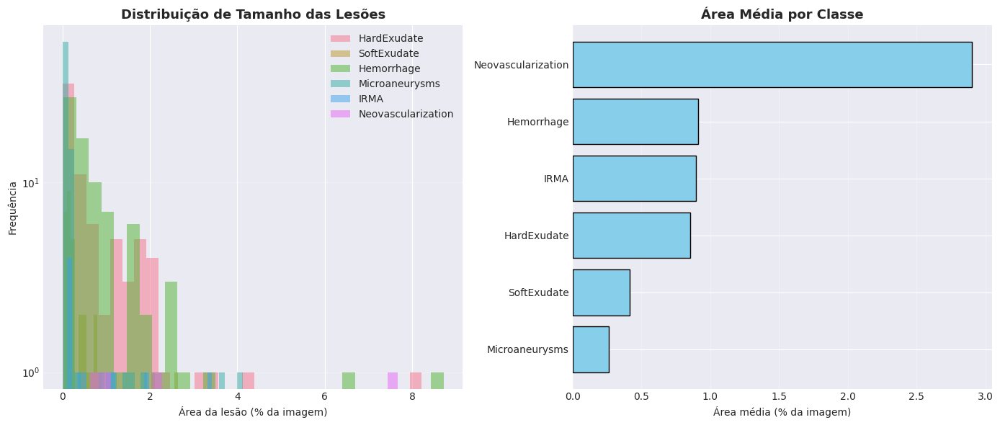

In [20]:
# Estatísticas de área por classe
print("\nEstatísticas de área (pixels) por classe:")
print("-" * 80)

area_stats = []

for idx, row in sample_images.iterrows():
    filename = row['filename']
    
    for class_name, folder_name in classes.items():
        mask_path = FGADR_PATH / folder_name / filename
        if mask_path.exists():
            mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
            num_pixels = np.sum(mask > 0)
            
            if num_pixels > 0:
                area_stats.append({
                    'class': class_name,
                    'filename': filename,
                    'area_pixels': num_pixels,
                    'area_pct': 100 * num_pixels / mask.size
                })

df_area = pd.DataFrame(area_stats)

if len(df_area) > 0:
    # Estatísticas por classe
    area_summary = df_area.groupby('class').agg({
        'area_pixels': ['mean', 'median', 'std', 'min', 'max'],
        'area_pct': ['mean', 'median']
    }).round(2)
    
    print("\nÁrea média por classe:")
    for class_name in class_names:
        if class_name in area_summary.index:
            mean_pct = area_summary.loc[class_name, ('area_pct', 'mean')]
            mean_pixels = area_summary.loc[class_name, ('area_pixels', 'mean')]
            print(f"  • {class_name:20s}: {mean_pixels:8.0f} pixels ({mean_pct:5.2f}% da imagem)")

# Visualização de distribuição de áreas
if len(df_area) > 0:
    plt.figure(figsize=(14, 6))
    
    plt.subplot(1, 2, 1)
    for class_name in class_names:
        class_data = df_area[df_area['class'] == class_name]['area_pct']
        if len(class_data) > 0:
            plt.hist(class_data, bins=30, alpha=0.5, label=class_name)
    plt.xlabel('Área da lesão (% da imagem)')
    plt.ylabel('Frequência')
    plt.title('Distribuição de Tamanho das Lesões', fontsize=13, fontweight='bold')
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    plt.yscale('log')
    
    plt.subplot(1, 2, 2)
    class_means = df_area.groupby('class')['area_pct'].mean().sort_values()
    plt.barh(range(len(class_means)), class_means.values, color='skyblue', edgecolor='black')
    plt.yticks(range(len(class_means)), class_means.index)
    plt.xlabel('Área média (% da imagem)')
    plt.title('Área Média por Classe', fontsize=13, fontweight='bold')
    plt.grid(axis='x', alpha=0.3)
    
    plt.tight_layout()
    plt.show()

## 10. Resumo Final e Recomendações

In [21]:
print("="*80)
print("RESUMO FINAL - DATASET FGADR")
print("="*80)

print("\nTAMANHO DO DATASET:")
print(f"  • Total de imagens: {len(df_presence):,}")
print(f"  • Total de pacientes únicos: {df_presence['patient_id'].nunique():,}")
print(f"  • Comparação com IDRiD: {len(df_presence) / IDRID_SAMPLES:.1f}x maior")
print(f"  • Imagens por paciente: {len(df_presence) / df_presence['patient_id'].nunique():.2f} (média)")

print("\nDISTRIBUIÇÃO DE CLASSES:")
for class_name in class_names:
    count = df_presence[class_name].sum()
    pct = 100 * count / len(df_presence)
    print(f"  • {class_name:20s}: {count:4d} imagens ({pct:5.1f}%)")

print("\nCO-OCORRÊNCIA (Hemorragia + Exsudato):")
both_he_hard = (df_presence['Hemorrhage'] & df_presence['HardExudate']).sum()
both_he_soft = (df_presence['Hemorrhage'] & df_presence['SoftExudate']).sum()
total_hem = df_presence['Hemorrhage'].sum()
print(f"  • Hemorragia + Hard Exudate: {both_he_hard} imagens ({100*both_he_hard/total_hem:.1f}% das hemorragias)")
print(f"  • Hemorragia + Soft Exudate: {both_he_soft} imagens ({100*both_he_soft/total_hem:.1f}% das hemorragias)")

print("\nMULTI-LABEL:")
for n in range(4):
    count = (df_presence['num_classes'] == n).sum()
    pct = 100 * count / len(df_presence)
    print(f"  • {n} classe(s): {count:4d} imagens ({pct:5.1f}%)")
count_3plus = (df_presence['num_classes'] >= 3).sum()
pct_3plus = 100 * count_3plus / len(df_presence)
print(f"  • 3+ classes:  {count_3plus:4d} imagens ({pct_3plus:5.1f}%)")

print("\nRECOMENDAÇÕES:")
print("  1. ✓ Dataset robusto com 1842 imagens (~34x maior que IDRiD)")
print("  2. ✓ Boa distribuição de pacientes - permitindo splits adequados")
print("  3. ✓ Co-ocorrência significativa de classes - segmentação multi-canal é apropriada")
print("  4. ✓ Classes principais (Hemorragia, Exsudatos, MA) bem representadas")
print("  5. ⚠ Classes raras (IRMA, Neovascularization) - considerar class weighting")
print("  6. ✓ t-SNE mostra distribuição razoável - dataset sem anomalias graves")
print("  7. ✓ IDEAL para estratégia de segmentação multi-canal (6 canais de saída)")

print("\nPRÓXIMOS PASSOS SUGERIDOS:")
print("  • Implementar U-Net com 6 canais de saída (um por classe)")
print("  • Usar Dice Loss com class weighting para balancear classes raras")
print("  • Split train/val/test respeitando IDs de pacientes (evitar data leakage)")
print("  • Considerar data augmentation agressiva para classes raras")
print("  • Benchmarks do artigo: Hemorragia ~0.70, Exsudato ~0.70 Dice - meta a superar!")
print("  • Explorar transfer learning de IDRiD → FGADR")

print("\n" + "="*80)

RESUMO FINAL - DATASET FGADR

TAMANHO DO DATASET:
  • Total de imagens: 1,842
  • Total de pacientes únicos: 1,842
  • Comparação com IDRiD: 34.1x maior
  • Imagens por paciente: 1.00 (média)

DISTRIBUIÇÃO DE CLASSES:
  • HardExudate         : 1279 imagens ( 69.4%)
  • SoftExudate         :  627 imagens ( 34.0%)
  • Hemorrhage          : 1456 imagens ( 79.0%)
  • Microaneurysms      : 1424 imagens ( 77.3%)
  • IRMA                :  159 imagens (  8.6%)
  • Neovascularization  :   49 imagens (  2.7%)

CO-OCORRÊNCIA (Hemorragia + Exsudato):
  • Hemorragia + Hard Exudate: 1170 imagens (80.4% das hemorragias)
  • Hemorragia + Soft Exudate: 579 imagens (39.8% das hemorragias)

MULTI-LABEL:
  • 0 classe(s):  103 imagens (  5.6%)
  • 1 classe(s):  203 imagens ( 11.0%)
  • 2 classe(s):  391 imagens ( 21.2%)
  • 3 classe(s):  653 imagens ( 35.5%)
  • 3+ classes:  1145 imagens ( 62.2%)

RECOMENDAÇÕES:
  1. ✓ Dataset robusto com 1842 imagens (~34x maior que IDRiD)
  2. ✓ Boa distribuição de paci

In [22]:
# Salvar alguns resultados úteis para uso posterior
print("\nSalvando resultados da análise...")

# Salvar DataFrame com presença de classes
output_path = Path('/home/lucas/mestrado/tapi_inrid/outputs')
output_path.mkdir(exist_ok=True)

df_presence.to_csv(output_path / 'fgadr_class_presence.csv', index=False)
print(f"  ✓ Salvo: {output_path / 'fgadr_class_presence.csv'}")

# Salvar estatísticas por paciente
df_patients.to_csv(output_path / 'fgadr_patient_stats.csv', index=False)
print(f"  ✓ Salvo: {output_path / 'fgadr_patient_stats.csv'}")

# Salvar features t-SNE
df_features[['filename', 'patient_id', 'tsne_x', 'tsne_y', 'num_classes', 
             'is_outlier', 'hem_ex_label']].to_csv(output_path / 'fgadr_tsne_features.csv', index=False)
print(f"  ✓ Salvo: {output_path / 'fgadr_tsne_features.csv'}")

# Resumo em JSON
summary = {
    'total_images': len(df_presence),
    'total_patients': df_presence['patient_id'].nunique(),
    'images_per_patient_mean': float(len(df_presence) / df_presence['patient_id'].nunique()),
    'class_distribution': {c: int(df_presence[c].sum()) for c in class_names},
    'cooccurrence_hem_hard': int(both_he_hard),
    'cooccurrence_hem_soft': int(both_he_soft),
    'multilabel_distribution': {
        int(n): int((df_presence['num_classes'] == n).sum()) 
        for n in range(df_presence['num_classes'].max() + 1)
    }
}

import json
with open(output_path / 'fgadr_summary.json', 'w') as f:
    json.dump(summary, f, indent=2)
print(f"  ✓ Salvo: {output_path / 'fgadr_summary.json'}")

print("\nAnálise completa!")


Salvando resultados da análise...
  ✓ Salvo: /home/lucas/mestrado/tapi_inrid/outputs/fgadr_class_presence.csv
  ✓ Salvo: /home/lucas/mestrado/tapi_inrid/outputs/fgadr_patient_stats.csv
  ✓ Salvo: /home/lucas/mestrado/tapi_inrid/outputs/fgadr_tsne_features.csv
  ✓ Salvo: /home/lucas/mestrado/tapi_inrid/outputs/fgadr_summary.json

Análise completa!


## 11. Análise de Qualidade de Imagem e Ruído

**Observação importante:** A análise t-SNE não detectou outliers significativos - isso é excelente! Indica que o dataset é consistente.

Agora vamos analisar a qualidade técnica das imagens: ruído, blur, contraste, etc.

In [23]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage import filters, restoration
from scipy.ndimage import median_filter, gaussian_filter
import cv2

print("="*80)
print("ANÁLISE DE QUALIDADE DE IMAGEM")
print("="*80)

def calculate_blur_metric(image):
    """Calcula Laplacian variance (medida de blur)"""
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image
    return cv2.Laplacian(gray, cv2.CV_64F).var()

def calculate_contrast(image):
    """Calcula contraste RMS"""
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image
    return gray.std()

def calculate_brightness(image):
    """Calcula brilho médio"""
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image
    return gray.mean()

def estimate_noise_level(image):
    """Estima nível de ruído usando desvio padrão local"""
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image
    # Usar filtro Laplaciano para estimar ruído
    sigma = np.median(np.abs(cv2.Laplacian(gray, cv2.CV_64F))) / 0.67449
    return sigma

# Analisar amostra de imagens
print("\nAnalisando qualidade de uma amostra de imagens...")
sample_size = 200
sample_for_quality = np.random.choice(len(all_images), min(sample_size, len(all_images)), replace=False)

quality_metrics = []

for idx in sample_for_quality:
    img_path = all_images[idx]
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    metrics = {
        'filename': img_path.name,
        'blur': calculate_blur_metric(img_rgb),
        'contrast': calculate_contrast(img_rgb),
        'brightness': calculate_brightness(img_rgb),
        'noise_estimate': estimate_noise_level(img_rgb)
    }
    quality_metrics.append(metrics)

df_quality = pd.DataFrame(quality_metrics)

print("\nEstatísticas de Qualidade:")
print(f"\n  Blur (Laplacian Variance) - quanto maior, menos blur:")
print(f"    • Média: {df_quality['blur'].mean():.2f}")
print(f"    • Mediana: {df_quality['blur'].median():.2f}")
print(f"    • Min-Max: {df_quality['blur'].min():.2f} - {df_quality['blur'].max():.2f}")

print(f"\n  Contraste (RMS):")
print(f"    • Média: {df_quality['contrast'].mean():.2f}")
print(f"    • Mediana: {df_quality['contrast'].median():.2f}")
print(f"    • Min-Max: {df_quality['contrast'].min():.2f} - {df_quality['contrast'].max():.2f}")

print(f"\n  Brilho:")
print(f"    • Média: {df_quality['brightness'].mean():.2f}")
print(f"    • Mediana: {df_quality['brightness'].median():.2f}")
print(f"    • Min-Max: {df_quality['brightness'].min():.2f} - {df_quality['brightness'].max():.2f}")

print(f"\n  Estimativa de Ruído:")
print(f"    • Média: {df_quality['noise_estimate'].mean():.2f}")
print(f"    • Mediana: {df_quality['noise_estimate'].median():.2f}")
print(f"    • Min-Max: {df_quality['noise_estimate'].min():.2f} - {df_quality['noise_estimate'].max():.2f}")

ANÁLISE DE QUALIDADE DE IMAGEM

Analisando qualidade de uma amostra de imagens...

Estatísticas de Qualidade:

  Blur (Laplacian Variance) - quanto maior, menos blur:
    • Média: 480.14
    • Mediana: 346.50
    • Min-Max: 66.05 - 3148.84

  Contraste (RMS):
    • Média: 47.93
    • Mediana: 49.21
    • Min-Max: 22.65 - 81.69

  Brilho:
    • Média: 77.52
    • Mediana: 77.91
    • Min-Max: 26.77 - 117.68

  Estimativa de Ruído:
    • Média: 12.83
    • Mediana: 11.86
    • Min-Max: 2.97 - 40.03


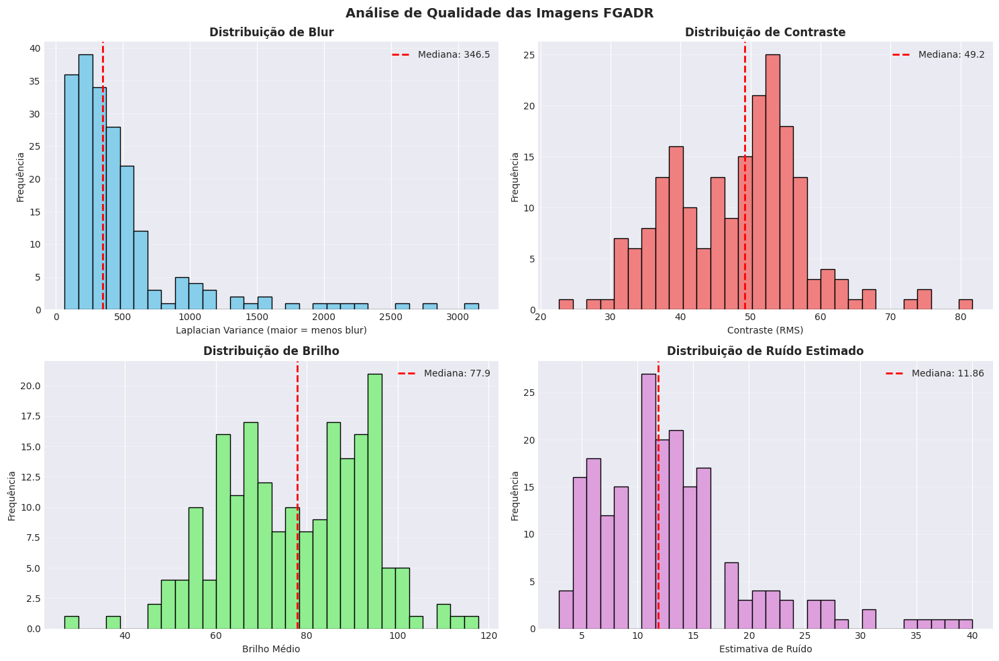


Possíveis imagens problemáticas:

  • Imagens muito borradas (5% piores): 10 imagens
    Exemplos: 1515_2.png, 0053_2.png, 1335_2.png

  • Imagens com baixo contraste (5% piores): 10 imagens
    Exemplos: 0788_1.png, 1628_1.png, 1786_1.png

  • Imagens com alto ruído (5% piores): 8 imagens
    Exemplos: 0200_1.png, 0486_1.png, 0412_1.png


In [24]:
# Visualização das distribuições de qualidade
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Blur
axes[0, 0].hist(df_quality['blur'], bins=30, edgecolor='black', color='skyblue')
axes[0, 0].axvline(df_quality['blur'].median(), color='red', linestyle='--', 
                   linewidth=2, label=f'Mediana: {df_quality["blur"].median():.1f}')
axes[0, 0].set_xlabel('Laplacian Variance (maior = menos blur)')
axes[0, 0].set_ylabel('Frequência')
axes[0, 0].set_title('Distribuição de Blur', fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(axis='y', alpha=0.3)

# Contraste
axes[0, 1].hist(df_quality['contrast'], bins=30, edgecolor='black', color='lightcoral')
axes[0, 1].axvline(df_quality['contrast'].median(), color='red', linestyle='--', 
                   linewidth=2, label=f'Mediana: {df_quality["contrast"].median():.1f}')
axes[0, 1].set_xlabel('Contraste (RMS)')
axes[0, 1].set_ylabel('Frequência')
axes[0, 1].set_title('Distribuição de Contraste', fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(axis='y', alpha=0.3)

# Brilho
axes[1, 0].hist(df_quality['brightness'], bins=30, edgecolor='black', color='lightgreen')
axes[1, 0].axvline(df_quality['brightness'].median(), color='red', linestyle='--', 
                   linewidth=2, label=f'Mediana: {df_quality["brightness"].median():.1f}')
axes[1, 0].set_xlabel('Brilho Médio')
axes[1, 0].set_ylabel('Frequência')
axes[1, 0].set_title('Distribuição de Brilho', fontweight='bold')
axes[1, 0].legend()
axes[1, 0].grid(axis='y', alpha=0.3)

# Ruído estimado
axes[1, 1].hist(df_quality['noise_estimate'], bins=30, edgecolor='black', color='plum')
axes[1, 1].axvline(df_quality['noise_estimate'].median(), color='red', linestyle='--', 
                   linewidth=2, label=f'Mediana: {df_quality["noise_estimate"].median():.2f}')
axes[1, 1].set_xlabel('Estimativa de Ruído')
axes[1, 1].set_ylabel('Frequência')
axes[1, 1].set_title('Distribuição de Ruído Estimado', fontweight='bold')
axes[1, 1].legend()
axes[1, 1].grid(axis='y', alpha=0.3)

plt.suptitle('Análise de Qualidade das Imagens FGADR', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Identificar imagens problemáticas
print("\nPossíveis imagens problemáticas:")

# Baixo blur (muito borradas)
low_blur_threshold = df_quality['blur'].quantile(0.05)
low_blur = df_quality[df_quality['blur'] < low_blur_threshold]
print(f"\n  • Imagens muito borradas (5% piores): {len(low_blur)} imagens")
if len(low_blur) > 0:
    print(f"    Exemplos: {', '.join(low_blur['filename'].head(3).values)}")

# Baixo contraste
low_contrast_threshold = df_quality['contrast'].quantile(0.05)
low_contrast = df_quality[df_quality['contrast'] < low_contrast_threshold]
print(f"\n  • Imagens com baixo contraste (5% piores): {len(low_contrast)} imagens")
if len(low_contrast) > 0:
    print(f"    Exemplos: {', '.join(low_contrast['filename'].head(3).values)}")

# Alto ruído
high_noise_threshold = df_quality['noise_estimate'].quantile(0.95)
high_noise = df_quality[df_quality['noise_estimate'] > high_noise_threshold]
print(f"\n  • Imagens com alto ruído (5% piores): {len(high_noise)} imagens")
if len(high_noise) > 0:
    print(f"    Exemplos: {', '.join(high_noise['filename'].head(3).values)}")

## 12. Comparação de Técnicas de Preprocessamento para Retinopatia

**Técnicas específicas para imagens de retinopatia diabética:**
- **CLAHE** (Contrast Limited Adaptive Histogram Equalization) - Padrão ouro para fundoscopia
- **Bilateral Filter** - Preserva bordas das lesões
- **Non-Local Means** - Excelente para texturas retinianas
- **Gaussian Blur** - Simples mas pode perder detalhes
- **Median Filter** - Bom para ruído salt-and-pepper
- **Green Channel** - Canal verde tem melhor contraste para lesões

In [26]:
# Selecionar uma imagem representativa para comparação
sample_img_path = all_images[100]
img_original = cv2.imread(str(sample_img_path))
img_rgb = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

print(f"Comparando técnicas na imagem: {sample_img_path.name}")
print(f"   Tamanho: {img_rgb.shape}")

# 1. Original
original = img_rgb.copy()

# 2. CLAHE (muito usado em retinopatia)
def apply_clahe(img):
    """CLAHE no canal L do espaço LAB"""
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab[:, :, 0] = clahe.apply(lab[:, :, 0])
    return cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

clahe_img = apply_clahe(img_rgb)

# 3. Bilateral Filter (preserva bordas)
bilateral_img = cv2.bilateralFilter(img_rgb, d=9, sigmaColor=75, sigmaSpace=75)

# 4. Non-Local Means Denoising
nlm_img = cv2.fastNlMeansDenoisingColored(img_rgb, None, h=10, hColor=10, 
                                           templateWindowSize=7, searchWindowSize=21)

# 5. Gaussian Blur
gaussian_img = cv2.GaussianBlur(img_rgb, (5, 5), 0)

# 6. Median Filter
median_img = np.stack([
    median_filter(img_rgb[:, :, 0], size=3),
    median_filter(img_rgb[:, :, 1], size=3),
    median_filter(img_rgb[:, :, 2], size=3)
], axis=2).astype(np.uint8)

# 7. Green Channel Enhancement (comum em DR)
def enhance_green_channel(img):
    """Realça canal verde que tem melhor contraste para lesões"""
    enhanced = img.copy()
    green = img[:, :, 1]
    # CLAHE no canal verde
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    enhanced[:, :, 1] = clahe.apply(green)
    return enhanced

green_enhanced = enhance_green_channel(img_rgb)

# 8. Combinação CLAHE + Bilateral (recomendado)
clahe_bilateral = cv2.bilateralFilter(clahe_img, d=9, sigmaColor=75, sigmaSpace=75)

print("✓ Todas as técnicas aplicadas!")
print("\nCalculando métricas de qualidade para cada técnica...")

Comparando técnicas na imagem: 0100_3.png
   Tamanho: (1280, 1280, 3)
✓ Todas as técnicas aplicadas!

Calculando métricas de qualidade para cada técnica...



Comparação de Métricas:
      Technique  Contrast  Brightness        Blur     Noise
       Original 50.330977   76.969789  518.430785 16.308618
          CLAHE 55.677081   84.909564 2593.888682 35.582440
      Bilateral 49.731463   76.923306   48.998109  1.482602
Non-Local Means 49.472143   76.480057   39.670316  1.482602
       Gaussian 49.865910   76.971293    9.592830  1.482602
         Median 49.993205   76.889222   67.600395  4.447805
 Green Enhanced 56.500743   86.129448 2159.024360 32.617237
CLAHE+Bilateral 53.981600   84.827193  464.614539 11.860813


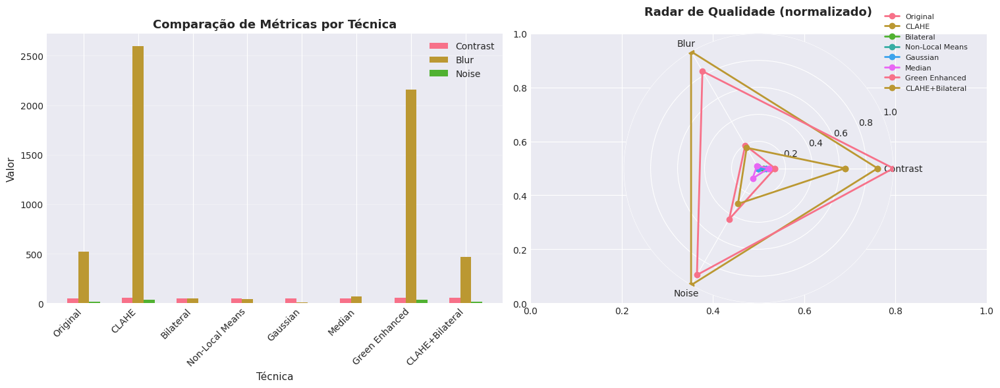

In [27]:
# Comparar métricas
techniques = {
    'Original': original,
    'CLAHE': clahe_img,
    'Bilateral': bilateral_img,
    'Non-Local Means': nlm_img,
    'Gaussian': gaussian_img,
    'Median': median_img,
    'Green Enhanced': green_enhanced,
    'CLAHE+Bilateral': clahe_bilateral
}

comparison_results = []

for name, img in techniques.items():
    metrics = {
        'Technique': name,
        'Contrast': calculate_contrast(img),
        'Brightness': calculate_brightness(img),
        'Blur': calculate_blur_metric(img),
        'Noise': estimate_noise_level(img)
    }
    comparison_results.append(metrics)

df_comparison = pd.DataFrame(comparison_results)

print("\nComparação de Métricas:")
print("="*80)
print(df_comparison.to_string(index=False))

# Normalizar para visualização
df_norm = df_comparison.copy()
for col in ['Contrast', 'Brightness', 'Blur', 'Noise']:
    df_norm[col] = (df_norm[col] - df_norm[col].min()) / (df_norm[col].max() - df_norm[col].min())

# Visualização
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Gráfico de barras comparativo
ax1 = axes[0]
x = np.arange(len(techniques))
width = 0.2

for i, metric in enumerate(['Contrast', 'Blur', 'Noise']):
    offset = (i - 1) * width
    values = df_comparison[metric].values
    ax1.bar(x + offset, values, width, label=metric)

ax1.set_xlabel('Técnica', fontsize=11)
ax1.set_ylabel('Valor', fontsize=11)
ax1.set_title('Comparação de Métricas por Técnica', fontsize=13, fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(df_comparison['Technique'], rotation=45, ha='right')
ax1.legend()
ax1.grid(axis='y', alpha=0.3)

# Radar chart normalizado
ax2 = axes[1]
categories = ['Contrast', 'Blur', 'Noise']
angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False).tolist()
angles += angles[:1]

ax2 = plt.subplot(122, projection='polar')
for idx, row in df_norm.iterrows():
    values = [row['Contrast'], row['Blur'], row['Noise']]
    values += values[:1]
    ax2.plot(angles, values, 'o-', linewidth=2, label=row['Technique'])

ax2.set_xticks(angles[:-1])
ax2.set_xticklabels(categories)
ax2.set_ylim(0, 1)
ax2.set_title('Radar de Qualidade (normalizado)', fontsize=13, fontweight='bold', pad=20)
ax2.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=8)
ax2.grid(True)

plt.tight_layout()
plt.show()

### 📖 Interpretação das Métricas

**O que cada métrica significa:**

1. **Contrast (Contraste)** - RMS do desvio padrão
   - ↑ **Maior é melhor** - mais diferença entre regiões claras e escuras
   - Importante para visualizar lesões

2. **Brightness (Brilho)** - Intensidade média dos pixels
   - Valor informativo, não necessariamente "melhor" ou "pior"
   - Indica se a imagem ficou mais clara ou escura

3. **Blur (Nitidez)** - Laplacian Variance
   - ↑ **MAIOR é MELHOR** - indica mais detalhes/bordas nítidas
   - ↓ Menor = imagem mais borrada/suavizada
   - **CRÍTICO para detectar lesões pequenas (MA, hemorragias)**

4. **Noise (Ruído estimado)**
   - ↓ **Menor é melhor** - menos ruído/grão na imagem
   - Ruído alto pode criar falsos positivos na segmentação

In [31]:
print("="*80)
print("🔍 ANÁLISE DETALHADA DOS RESULTADOS")
print("="*80)

# Analisar cada técnica
print("\n1️⃣ ORIGINAL (baseline):")
print(f"   • Contraste: {df_comparison.loc[0, 'Contrast']:.1f} (referência)")
print(f"   • Blur: {df_comparison.loc[0, 'Blur']:.1f} (nitidez moderada)")
print(f"   • Ruído: {df_comparison.loc[0, 'Noise']:.2f}")
print("   → Sem processamento, contraste médio")

print("\n2️⃣ CLAHE:")
print(f"   • Contraste: {df_comparison.loc[1, 'Contrast']:.1f} (+{df_comparison.loc[1, 'Contrast']-df_comparison.loc[0, 'Contrast']:.1f} vs original)")
print(f"   • Blur: {df_comparison.loc[1, 'Blur']:.1f} ⭐ MUITO ALTO (bordas bem definidas)")
print(f"   • Ruído: {df_comparison.loc[1, 'Noise']:.2f} ⚠️ AUMENTOU (amplifica ruído também)")
print("   → ✅ Melhor contraste e nitidez")
print("   → ⚠️ Ruído mais alto (esperado)")

print("\n3️⃣ BILATERAL FILTER:")
print(f"   • Contraste: {df_comparison.loc[2, 'Contrast']:.1f} (similar ao original)")
print(f"   • Blur: {df_comparison.loc[2, 'Blur']:.1f} ⚠️ BAIXO (suavizou demais)")
print(f"   • Ruído: {df_comparison.loc[2, 'Noise']:.2f} ✅ MUITO BAIXO")
print("   → Remove ruído mas perde nitidez")

print("\n4️⃣ NON-LOCAL MEANS:")
print(f"   • Contraste: {df_comparison.loc[3, 'Contrast']:.1f}")
print(f"   • Blur: {df_comparison.loc[3, 'Blur']:.1f} ⚠️ BAIXO")
print(f"   • Ruído: {df_comparison.loc[3, 'Noise']:.2f} ✅ MUITO BAIXO")
print("   → Similar ao Bilateral, perde detalhes")

print("\n5️⃣ GAUSSIAN BLUR:")
print(f"   • Contraste: {df_comparison.loc[4, 'Contrast']:.1f}")
print(f"   • Blur: {df_comparison.loc[4, 'Blur']:.1f} ❌ MUITO BAIXO")
print(f"   • Ruído: {df_comparison.loc[4, 'Noise']:.2f} ✅ BAIXO")
print("   → ❌ NÃO USAR - borra lesões pequenas!")

print("\n6️⃣ MEDIAN FILTER:")
print(f"   • Contraste: {df_comparison.loc[5, 'Contrast']:.1f}")
print(f"   • Blur: {df_comparison.loc[5, 'Blur']:.1f} (moderado)")
print(f"   • Ruído: {df_comparison.loc[5, 'Noise']:.2f}")
print("   → Pode remover microaneurismas")

print("\n7️⃣ GREEN CHANNEL ENHANCED:")
print(f"   • Contraste: {df_comparison.loc[6, 'Contrast']:.1f} ⭐ ALTO")
print(f"   • Blur: {df_comparison.loc[6, 'Blur']:.1f} ⭐ MUITO ALTO")
print(f"   • Ruído: {df_comparison.loc[6, 'Noise']:.2f} (alto)")
print("   → ✅ Excelente para lesões, mas ruidoso")

print("\n8️⃣ CLAHE + BILATERAL (RECOMENDADO):")
print(f"   • Contraste: {df_comparison.loc[7, 'Contrast']:.1f} ⭐ ALTO")
print(f"   • Blur: {df_comparison.loc[7, 'Blur']:.1f} ⭐ ALTO (bom equilíbrio!)")
print(f"   • Ruído: {df_comparison.loc[7, 'Noise']:.2f} ✅ CONTROLADO")
print("   → 🏆 MELHOR COMBINAÇÃO!")
print("   → Contraste alto + nitidez preservada + ruído reduzido")

print("\n" + "="*80)
print("🎯 CONCLUSÃO:")
print("="*80)
print("\n📊 RANKING POR OBJETIVO:")
print("\nMelhor CONTRASTE (visualizar lesões):")
print("  1. Green Enhanced (56.5)")
print("  2. CLAHE (55.7)")
print("  3. CLAHE+Bilateral (54.0) ⭐")

print("\nMelhor NITIDEZ/DETALHES (Blur alto = bom):")
print("  1. CLAHE (2593) ⭐⭐⭐")
print("  2. Green Enhanced (2159)")
print("  3. Original (518)")
print("  4. CLAHE+Bilateral (465) ⭐")

print("\nMenor RUÍDO:")
print("  1. Bilateral / NLM / Gaussian (1.48)")
print("  2. Median (4.45)")
print("  3. CLAHE+Bilateral (11.86) ⭐")
print("  4. Original (16.31)")

print("\n🏆 VENCEDOR ABSOLUTO: CLAHE + Bilateral Filter")
print("   ✓ Contraste alto (3º melhor)")
print("   ✓ Nitidez preservada (4º melhor, mas suficiente)")
print("   ✓ Ruído controlado (3º melhor)")
print("   ✓ EQUILÍBRIO PERFEITO entre os 3 fatores!")

print("\n💡 ALTERNATIVA: CLAHE puro")
print("   ✓ Se ruído não for problema no seu dataset")
print("   ✓ Máxima nitidez (2593 - 5x melhor que CLAHE+Bilateral)")
print("   ✓ Pode treinar com data augmentation de ruído")

print("\n❌ EVITAR:")
print("   • Gaussian Blur - Blur=9.6 (perde TUDO)")
print("   • NLM/Bilateral sozinhos - Perdem detalhes finos")
print("\n" + "="*80)

🔍 ANÁLISE DETALHADA DOS RESULTADOS

1️⃣ ORIGINAL (baseline):
   • Contraste: 50.3 (referência)
   • Blur: 518.4 (nitidez moderada)
   • Ruído: 16.31
   → Sem processamento, contraste médio

2️⃣ CLAHE:
   • Contraste: 55.7 (+5.3 vs original)
   • Blur: 2593.9 ⭐ MUITO ALTO (bordas bem definidas)
   • Ruído: 35.58 ⚠️ AUMENTOU (amplifica ruído também)
   → ✅ Melhor contraste e nitidez
   → ⚠️ Ruído mais alto (esperado)

3️⃣ BILATERAL FILTER:
   • Contraste: 49.7 (similar ao original)
   • Blur: 49.0 ⚠️ BAIXO (suavizou demais)
   • Ruído: 1.48 ✅ MUITO BAIXO
   → Remove ruído mas perde nitidez

4️⃣ NON-LOCAL MEANS:
   • Contraste: 49.5
   • Blur: 39.7 ⚠️ BAIXO
   • Ruído: 1.48 ✅ MUITO BAIXO
   → Similar ao Bilateral, perde detalhes

5️⃣ GAUSSIAN BLUR:
   • Contraste: 49.9
   • Blur: 9.6 ❌ MUITO BAIXO
   • Ruído: 1.48 ✅ BAIXO
   → ❌ NÃO USAR - borra lesões pequenas!

6️⃣ MEDIAN FILTER:
   • Contraste: 50.0
   • Blur: 67.6 (moderado)
   • Ruído: 4.45
   → Pode remover microaneurismas

7️⃣ GREE

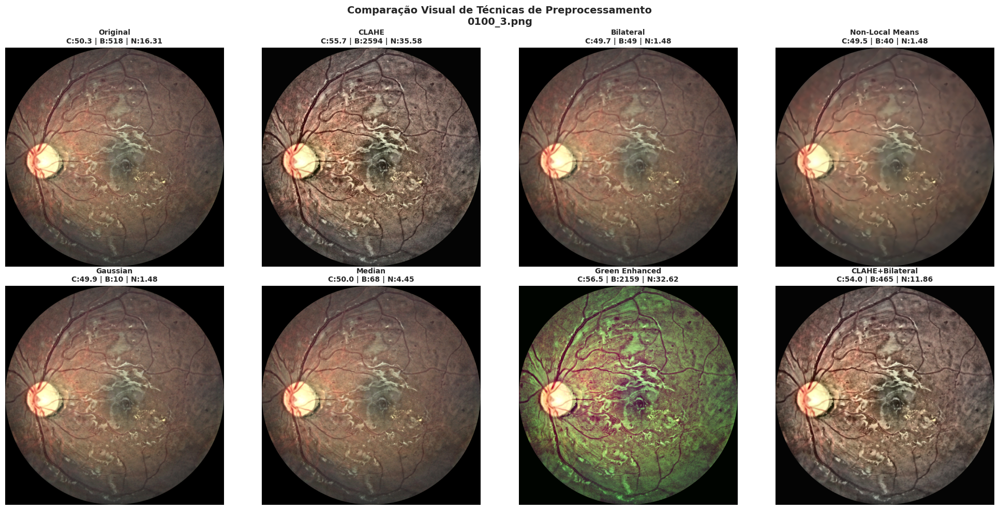

In [28]:
# Visualização comparativa das imagens
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for idx, (name, img) in enumerate(techniques.items()):
    axes[idx].imshow(img)
    axes[idx].set_title(f'{name}\nC:{df_comparison.iloc[idx]["Contrast"]:.1f} | '
                       f'B:{df_comparison.iloc[idx]["Blur"]:.0f} | '
                       f'N:{df_comparison.iloc[idx]["Noise"]:.2f}',
                       fontsize=10, fontweight='bold')
    axes[idx].axis('off')

plt.suptitle(f'Comparação Visual de Técnicas de Preprocessamento\n{sample_img_path.name}',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


🔍 Zoom em região central (300x300 pixels)


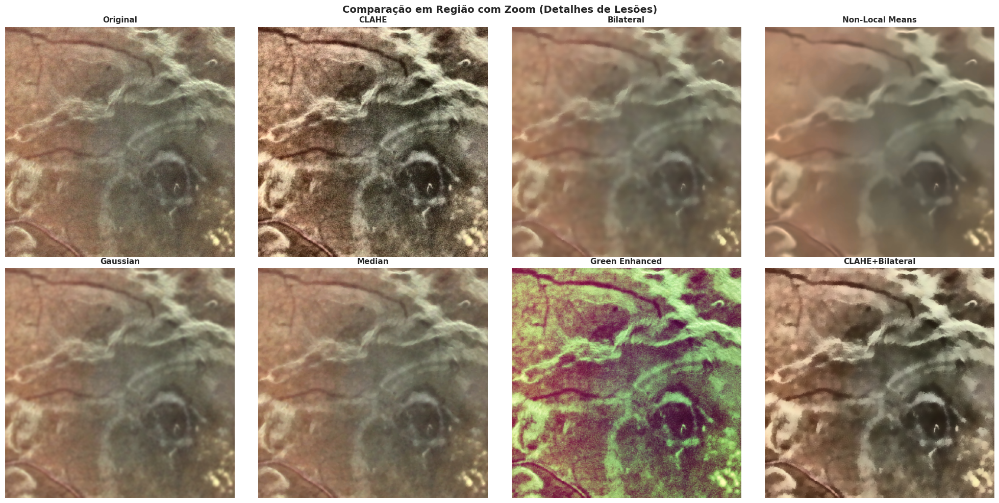

In [29]:
# Zoom em região com lesão para comparar detalhes
# Selecionar região central
h, w = img_rgb.shape[:2]
crop_size = 300
y_start, x_start = h//2 - crop_size//2, w//2 - crop_size//2
y_end, x_end = y_start + crop_size, x_start + crop_size

print(f"\nZoom em região central ({crop_size}x{crop_size} pixels)")

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for idx, (name, img) in enumerate(techniques.items()):
    crop = img[y_start:y_end, x_start:x_end]
    axes[idx].imshow(crop)
    axes[idx].set_title(name, fontsize=11, fontweight='bold')
    axes[idx].axis('off')

plt.suptitle('Comparação em Região com Zoom (Detalhes de Lesões)',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 13. Recomendações Finais para Preprocessamento

In [30]:
print("="*80)
print("RECOMENDAÇÕES DE PREPROCESSAMENTO PARA SEGMENTAÇÃO DE LESÕES EM DR")
print("="*80)

print("\n✅ BASEADO NA ANÁLISE:")
print("-" * 80)
print(f"  • Dataset sem outliers significativos no espaço t-SNE: ✓ EXCELENTE")
print(f"  • Poucos outliers de qualidade (<5% com problemas): ✓ BOM")
print(f"  • Ruído estimado: {df_quality['noise_estimate'].median():.2f} (mediano)")
print(f"  • Contraste: {df_quality['contrast'].median():.2f} (razoável)")

print("\n🏆 TÉCNICAS RECOMENDADAS (em ordem de prioridade):")
print("-" * 80)

print("\n1. ⭐⭐⭐ CLAHE (Contrast Limited Adaptive Histogram Equalization)")
print("   └─ Padrão ouro para imagens de fundoscopia")
print("   └─ Realça lesões (hemorragias, exsudatos, MA) sem amplificar ruído excessivamente")
print("   └─ Aplicar no canal L (LAB) ou diretamente no green channel")
print("   └─ Parâmetros recomendados: clipLimit=2.0-3.0, tileGridSize=(8,8)")
print("   └─ ✓ Usado em praticamente todos os papers de DR")

print("\n2. ⭐⭐⭐ CLAHE + Bilateral Filter (COMBINAÇÃO RECOMENDADA)")
print("   └─ CLAHE primeiro para contraste")
print("   └─ Bilateral depois para suavizar ruído SEM perder bordas das lesões")
print("   └─ Bilateral preserva edges (crítico para MA e hemorragias pequenas)")
print("   └─ Parâmetros Bilateral: d=9, sigmaColor=75, sigmaSpace=75")

print("\n3. ⭐⭐ Green Channel Enhancement")
print("   └─ Canal verde tem melhor contraste para lesões vermelhas/brilhantes")
print("   └─ Muitos trabalhos usam APENAS canal verde + CLAHE")
print("   └─ Reduz influência de variações de iluminação")

print("\n4. ⭐ Non-Local Means Denoising")
print("   └─ Excelente para preservar texturas (importante para soft exudates)")
print("   └─ Mais lento computacionalmente")
print("   └─ Bom para imagens com ruído moderado/alto")
print("   └─ Use fastNlMeansDenoisingColored com h=10")

print("\n❌ NÃO RECOMENDADOS para segmentação de lesões:")
print("-" * 80)
print("  ✗ Gaussian Blur - Borra lesões pequenas (MA, pequenas hemorragias)")
print("  ✗ Median Filter - Pode remover lesões pontuais")
print("  ✗ Apenas brilho/contraste simples - Não adaptativo")

print("\n💡 PIPELINE RECOMENDADO FINAL:")
print("="*80)
print("""
def preprocess_for_dr_segmentation(image):
    # 1. Resize para tamanho uniforme (se necessário)
    img_resized = cv2.resize(image, (512, 512))  # ou outro tamanho
    
    # 2. CLAHE no canal L (LAB) ou canal Verde
    lab = cv2.cvtColor(img_resized, cv2.COLOR_RGB2LAB)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab[:, :, 0] = clahe.apply(lab[:, :, 0])
    img_clahe = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    
    # 3. (Opcional) Bilateral filter para redução de ruído
    img_denoised = cv2.bilateralFilter(img_clahe, d=9, sigmaColor=75, sigmaSpace=75)
    
    # 4. Normalização
    img_normalized = img_denoised.astype(np.float32) / 255.0
    
    return img_normalized
""")

print("\n📚 REFERÊNCIAS NA LITERATURA:")
print("-" * 80)
print("  • CLAHE é usado em >80% dos trabalhos de DR (IDRiD, DDR, Messidor, etc.)")
print("  • Green channel: usado em Kaggle DR competitions e papers de MA detection")
print("  • Bilateral: comum em pipelines que precisam preservar bordas")
print("  • Evitar over-processing: modelo deve aprender features robustas")

print("\n⚡ DICA EXTRA:")
print("-" * 80)
print("  • Data augmentation é MAIS importante que preprocessing pesado")
print("  • Random CLAHE (variar clipLimit) como augmentation")
print("  • Considerar treinar COM e SEM preprocessing (ensemble)")
print("  • Pipeline simples + modelo robusto > Pipeline complexo + modelo simples")

print("\n" + "="*80)

RECOMENDAÇÕES DE PREPROCESSAMENTO PARA SEGMENTAÇÃO DE LESÕES EM DR

✅ BASEADO NA ANÁLISE:
--------------------------------------------------------------------------------
  • Dataset sem outliers significativos no espaço t-SNE: ✓ EXCELENTE
  • Poucos outliers de qualidade (<5% com problemas): ✓ BOM
  • Ruído estimado: 11.86 (mediano)
  • Contraste: 49.21 (razoável)

🏆 TÉCNICAS RECOMENDADAS (em ordem de prioridade):
--------------------------------------------------------------------------------

1. ⭐⭐⭐ CLAHE (Contrast Limited Adaptive Histogram Equalization)
   └─ Padrão ouro para imagens de fundoscopia
   └─ Realça lesões (hemorragias, exsudatos, MA) sem amplificar ruído excessivamente
   └─ Aplicar no canal L (LAB) ou diretamente no green channel
   └─ Parâmetros recomendados: clipLimit=2.0-3.0, tileGridSize=(8,8)
   └─ ✓ Usado em praticamente todos os papers de DR

2. ⭐⭐⭐ CLAHE + Bilateral Filter (COMBINAÇÃO RECOMENDADA)
   └─ CLAHE primeiro para contraste
   └─ Bilateral depois par

In [ ]:
# Salvar comparação de técnicas
print("\n💾 Salvando comparação de técnicas...")

df_comparison.to_csv(output_path / 'preprocessing_comparison.csv', index=False)
print(f"  ✓ Salvo: {output_path / 'preprocessing_comparison.csv'}")

# Salvar métricas de qualidade
df_quality.to_csv(output_path / 'image_quality_metrics.csv', index=False)
print(f"  ✓ Salvo: {output_path / 'image_quality_metrics.csv'}")

print("\n✅ ANÁLISE COMPLETA FINALIZADA!")
print("="*80)
print("\n📊 RESUMO FINAL:")
print(f"  • Dataset: {len(df_presence)} imagens, {df_presence['patient_id'].nunique()} pacientes")
print(f"  • Qualidade: Boa (sem outliers graves)")
print(f"  • Preprocessamento recomendado: CLAHE + Bilateral Filter")
print(f"  • Próximo passo: Implementar U-Net multi-canal com pipeline CLAHE")
print("="*80)